# システム解析論 レポート 4

29C23002 石川健太郎

## コメント

Les Paul and Mary Ford の Josephine の最後の箇所にかなりエンドロールらしさを感じたので、これをエンドロールにする。

ピッチを変えずに速度を変更する。
このとき、全体で一様にするのではなく、非線形に徐々に遅くなっていくようにする。
徐々に遅くするとエンドロールらしくなるのでは、と考えた。

また、バンドパスフィルタに通して、レディオボイスのような効果をつける。

In [ ]:
funcprot(0); // disable message on redefining a function

In [ ]:
Fₛ = 16000;

In [ ]:
[s₁, s₁_info] = loadwave('Josephine.wav');
Fₛ₁ = s₁_info(3); // sampling rate
Mₛ₁ = s₁_info(8); // number of samples
x = intdec(s₁(1,4805000:5150000)', Fₛ/Fₛ₁);
Mₓ = length(x);

加工前の波形は次の通り。

In [4]:
plot(1:length(x), x');
xtitle('Waveform', 'Sample', 'Amplitude');

In [5]:
wavwrite(x, Fₛ, 'x.wav');

次の関数 $f$ にしたがって速度を調節する。

In [ ]:
// x in [0, 1]
function y = f(x)
    y = 0.1*(x-0.5)^3 + 1.25;
endfunction

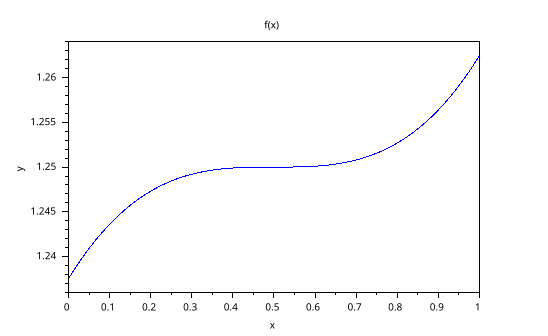

In [7]:
plot(0:0.001:1, f(0:0.001:1));
xtitle('f(x)', 'x', 'y');

In [ ]:
L = 8192; // chunk length
chunksₓ = list(); // separate x into chunks
rates = []; // f(n) of n-th chunk
for n = 1:floor(Mₓ/L)
    offset = (n-1)*L;
    rates = [rates, f(offset/Mₓ)];
    chunksₓ(n) = x(offset+1:offset+L);
end

In [ ]:
function output = change_rate(s, Fₛ, rate)
    Mˢ = length(s);
    template_size = floor(Fₛ*0.01); //10ms
    pₘᵢₙ = floor(Fₛ*0.005); //5ms
    pₘₐₓ = floor(Fₛ*0.02);  //20ms
    r = zeros(1, pₘₐₓ);
    Mᵒ = round(Mˢ*rate);
    output = zeros(1, Mᵒ);
    offset₀ = 1;
    offset₁ = 1; 
    while offset₀+pₘₐₓ*2 < Mˢ
        x = s(offset₀:offset₀+template_size);
        rₘₐₓ = 0;
        p = pₘᵢₙ;

        for m = pₘᵢₙ:pₘₐₓ
            y = s(offset₀+m:offset₀+m+template_size);
            r(m) = sum(x*y');
            if r(m) > rₘₐₓ
                rₘₐₓ = r(m);
                p = m;
            end
        end
        clear r
        clear m

        q = round(p/(rate-1));  //Expanded length
        l = min(p, q);

        fadein = (l-[1:1:p+q]+p) / l;
        fadeout = ([1:1:p+q]-p) / l;

        for m=0:p+q-1
            if offset₁+m > Mᵒ
                break;
            end
            if 0 <= m & m < p
               output(offset₁+m) = s(offset₀+m);
            elseif p <= m & m < p+l
               output(offset₁+m) = (s(offset₀+m)+s(offset₀-p+m))*fadeout(m);
            elseif p+l <= m & m < p+q
               output(offset₁+m) = s(offset₀-p+m);
            end
        end

        offset₀ = offset₀ + q;
        offset₁=offset₁ + p + q;
    end

    for n = 1:Mᵒ
        e = 0;
        for m = 1:100
            if n - m <= 0
                break;
            end
            if output(n-m) < 0.05
                e = e + 1;
                break;
            end
            if e > 90
                return output(1:n-m);
            end
        end
    end
endfunction

In [ ]:
y = [];

for n = 1:floor(Mₓ/L)
    y = [y, change_rate(chunksₓ(n), Fₛ, rates(n))];
end

In [ ]:
wavwrite(y, Fₛ, 'y_intermediate_1.wav');

速度変更レートが異なる区間の境界で音が途切れている。

In [54]:
plot(1:length(y), y);
xtitle('Waveform', 'Sample', 'Amplitude');

この段階だとプツプツというノイズが入っている。

波形では途切れたように見える。

エコーをかけてこれを消す。

In [ ]:
function y = delay_echo(x, Fₛ, delay, A)
    D = floor(Fₛ * delay);
    y = x;
    for i = (D + 1):length(x)
        y(i) = y(i) + A * x(i - D);
    end
endfunction

In [ ]:
for i = 1:3
    y = delay_echo(y, Fₛ, 0.05, 0.5);
end

In [ ]:
wavwrite(y, Fₛ, 'y_intermediate_2.wav');

In [58]:
plot(1:length(y), y);
xtitle('Waveform', 'Sample', 'Amplitude');

バンドパスフィルタに通す。

In [ ]:
function [b,a]=IIR_bandpass(fc, Q)
    fc=tan(%pi*fc)/(2*%pi);
    a(1)=1+2*%pi*fc/Q+4*%pi*%pi*fc*fc;
    a(2)=(8*%pi*%pi*fc*fc-2)/a(1);
    a(3)=(1-2*%pi*fc/Q+4*%pi*%pi*fc*fc)/a(1);
    b(1)=2*%pi*fc/Q/a(1);
    b(2)=0;
    b(3)=-2*%pi*fc/Q/a(1);
    a(1)=1;
endfunction

In [ ]:
Q = 20;
[b,a] = IIR_bandpass(1000/Fₛ, 10);
y = filter(b,a,y);
y = 5 * y; // modify amplitude

In [61]:
plot(1:length(y), y);
xtitle('Waveform', 'Sample', 'Amplitude');

In [ ]:
wavwrite(y, Fₛ, 'y.wav');

最終的な出力として `y.wav` が得られた。

## 添付ファイル

| ファイル名 | 内容 |
| --- | --- |
| Josephine.wav | オリジナルの音声ファイル |
| x.wav | 加工前の音声ファイル |
| y_intermediate_1.wav | 速度を変更した時点 |
| y_intermediate_1.wav | ディレイをかけた時点 |
| y.wav | 最終的に得られた音声ファイル |

## Scilab 実行環境

In [ ]:
[version, opts] = getversion();
COMPILER = opts(1);
ARCH = opts(2);
RELEASE_MODE = opts($-2);
RELEASE_DATE = opts($-1);
RELEASE_TIME = opts($);
VER_NUMS = getversion('scilab');

In [22]:
mprintf("COMPILER    : %s", COMPILER);
mprintf("ARCH        : %s", ARCH);
mprintf("RELEASE_MODE: %s", RELEASE_MODE);
mprintf("RELEASE_DATE: %s", RELEASE_DATE);
mprintf("RELEASE_TIME: %s", RELEASE_TIME);
mprintf("VERSION     : %d.%d.%d", VER_NUMS(1), VER_NUMS(2), VER_NUMS(3));

COMPILER    : GCC
ARCH        : x64
RELEASE_MODE: release
RELEASE_DATE: Nov 21 2020
RELEASE_TIME: 10:42:41
VERSION     : 6.1.0
